<a href="https://colab.research.google.com/github/MarinPedro/ThermalProject2026_HOCV/blob/gd-test/CopiaDeSCV_P.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Importations and Installations

Run this command if you want to remove your current folder

In [1]:
%%capture
!rm -rf /content/IHTest_202104_DistStA/
%mkdir -p /content/IHTest_202104_DistStA/sample_1
%mkdir -p /content/IHTest_202104_DistStA/sample_2
%mkdir -p /content/IHTest_202104_DistStA/sample_3
%mkdir -p /content/IHTest_202104_DistStA/sample_4

Loading some data from the 202104 collection of the Darpa Invisible Headlights dataset

In [2]:
%%capture
!pip install spectral
!pip install awscli -q
!pip install laspy

In [3]:
%%capture

!aws s3 sync \
  s3://ihdataset-01/IHTest_202104_DistStA/Path15_DistStA/Path15_Step16_DistStA/ \
  /content/IHTest_202104_DistStA/sample_1 \
  --no-sign-request \
  --exclude "*" \
  --include "*LWHSI*.hdr" \
  --include "*LWHSI*.bsq" \
  --include "*.las" \
  --include "*BBVISRIGHT*"

!aws s3 sync \
  s3://ihdataset-01/IHTest_202104_DistStA/Path17_DistStA/Path17_Step14_DistStA/ \
  /content/IHTest_202104_DistStA/sample_2 \
  --no-sign-request \
  --exclude "*" \
  --include "*LWHSI*.hdr" \
  --include "*LWHSI*.bsq" \
  --include "*.las" \
  --include "*BBVISRIGHT*"

!aws s3 sync \
  s3://ihdataset-01/IHTest_202104_DistStA/Path9_DistStA/Path9_Step16_DistStA/ \
  /content/IHTest_202104_DistStA/sample_3 \
  --no-sign-request \
  --exclude "*" \
  --include "*LWHSI*.hdr" \
  --include "*LWHSI*.bsq" \
  --include "*.las" \
  --include "*BBVISRIGHT*"

!aws s3 sync \
  s3://ihdataset-01/IHTest_202104_DistStA/Path19_DistStA/Path19_Step17_DistStA/ \
  /content/IHTest_202104_DistStA/sample_4 \
  --no-sign-request \
  --exclude "*" \
  --include "*LWHSI*.hdr" \
  --include "*LWHSI*.bsq" \
  --include "*.las" \
  --include "*BBVISRIGHT*"

Loading the Ecostress Spectral Library

In [4]:
%%capture
! rm -rf /content/ecostress_spectral
%cd ..
! git clone -n --depth=1 --filter=tree:0 \
  https://github.com/MarinPedro/ThermalProject2026_HOCV /content/ecostress_spectral
%cd /content/ecostress_spectral
! git sparse-checkout set --no-cone ecostress
! git checkout

Importing libraries

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import spectral.io.envi as envi
import glob
import laspy
import plotly.graph_objects as go
from pathlib import Path
from sklearn.cluster import KMeans
from skimage.color import rgb2gray
from sklearn.cluster import KMeans
from skimage.transform import resize

#  Functions
Implementing the functions used for the notebook (Cortesy from the Hands-On Computer Vision team)

In [6]:
MICROFLICK_PER_W_M2 = 100.0

def robust_image(image, low=2, high=98):
    """Normalize an image for display using percentiles."""
    lo, hi = np.percentile(image, [low, high])
    return np.clip((image - lo) / (hi - lo + 1e-12), 0, 1)

def blackbody_radiance(wavelenghts_um, temperature_k):
    """Planck blackbody spectral radiance for all bands, in uW / (sr um cm^2)."""
    h = 6.62607015e-34
    c = 299792458.0
    k = 1.380649e-23

    wavelength_m = wavelengths_um * 1e-6

    x = (h * c) / (wavelength_m * k * temperature_k)

    radiance_w_m2_sr_um = (2.0 * h * c**2) / (wavelength_m**5 * np.expm1(x)) * 1e-6
    radiance_microflicks = radiance_w_m2_sr_um * MICROFLICK_PER_W_M2

    return radiance_microflicks.astype(np.float32)

def basic_stats(points):
    """Prints basic statistics of the cloud"""
    xyz = points[:, :3]
    ranges = np.linalg.norm(xyz, axis=1)

    print("Number of points:", len(points))
    print("Columns:", points.shape[1], "→ x, y, z, intensity")
    print("Minimum / medium / maximum range [m]:", ranges.min(), ranges.mean(), ranges.max())
    print("x min/max:", xyz[:, 0].min(), xyz[:, 0].max())
    print("y min/max:", xyz[:, 1].min(), xyz[:, 1].max())
    print("z min/max:", xyz[:, 2].min(), xyz[:, 2].max())


def subsample(points, max_points=8000, seed=0):
    """Subshow points for a fast plotting."""
    if len(points) <= max_points:
        return points
    rng = np.random.default_rng(seed)
    idx = rng.choice(len(points), size=max_points, replace=False)
    return points[idx]


def plot_point_cloud(points, color_by="range", max_points=8000, title="Nube de puntos LiDAR"):
    """
    Interactive 3D plotting with Plotly.
    color_by can be: 'range', 'z' or 'intesity'.
    """
    pts = subsample(points, max_points=max_points)
    xyz = pts[:, :3]
    ranges = np.linalg.norm(xyz, axis=1)

    if color_by == "z":
        color = xyz[:, 2]
        label = "z height"
    elif color_by == "intensity":
        color = pts[:, 3]
        label = "Intensity"
    else:
        color = ranges
        label = "Range"

    fig = go.Figure(data=[
        go.Scatter3d(
            x=xyz[:, 0],
            y=xyz[:, 1],
            z=xyz[:, 2],
            mode="markers",
            marker=dict(
                size=2,
                color=color,
                colorscale="Viridis",
                opacity=0.8,
                colorbar=dict(title=label)
            )
        )
    ])

    fig.update_layout(
        title=title,
        scene=dict(
            xaxis_title="x [m]",
            yaxis_title="y [m]",
            zaxis_title="z [m]",
            aspectmode="data"
        ),
        width=900,
        height=650
    )
    fig.show()



def compute_range_image(
    points,
    H=64,
    W=512,
    v_fov=(-25, 3),
    h_fov=(-70, 70),
    min_range=0.5,
    max_range=80.0
):
    """
    Converts 3D points into a depth/range image.

    H: number of rows, similar to LiDAR vertical channels.
    W: horizontal angular resolution.
    v_fov: approximate vertical field of view in degrees.
    h_fov: horizontal field of view in degrees. Using a frontal FOV prevents
           the image from having many empty columns.
    min_range, max_range: valid distance range in meters.

    Note:
    If multiple points fall into the same pixel, the closest one is kept.
    """
    xyz = points[:, :3]
    x, y, z = xyz[:, 0], xyz[:, 1], xyz[:, 2]
    r = np.linalg.norm(xyz, axis=1)

    eps = 1e-9
    azimuth = np.arctan2(y, x)
    elevation = np.arcsin(z / np.maximum(r, eps))

    el_min, el_max = np.deg2rad(v_fov[0]), np.deg2rad(v_fov[1])
    az_min, az_max = np.deg2rad(h_fov[0]), np.deg2rad(h_fov[1])

    u = ((azimuth - az_min) / (az_max - az_min) * (W - 1)).astype(int)
    v = (1 - (elevation - el_min) / (el_max - el_min)) * (H - 1)
    v = v.astype(int)

    valid = (
        (r >= min_range) & (r <= max_range) &
        (azimuth >= az_min) & (azimuth <= az_max) &
        (elevation >= el_min) & (elevation <= el_max) &
        (u >= 0) & (u < W) &
        (v >= 0) & (v < H)
    )

    flat_idx = v[valid] * W + u[valid]
    range_flat = np.full(H * W, np.inf, dtype=np.float32)
    np.minimum.at(range_flat, flat_idx, r[valid].astype(np.float32))

    range_img = range_flat.reshape(H, W)
    range_img[~np.isfinite(range_img)] = np.nan
    return range_img


def crop_valid_region(img, pad_rows=2, pad_cols=8):
    """
    Automatically crops the region containing valid measurements.
    This helps prevent images with too much empty space.
    """
    valid = np.isfinite(img)

    if not valid.any():
        return img

    rows = np.where(valid.any(axis=1))[0]
    cols = np.where(valid.any(axis=0))[0]

    r0 = max(0, rows.min() - pad_rows)
    r1 = min(img.shape[0], rows.max() + pad_rows + 1)
    c0 = max(0, cols.min() - pad_cols)
    c1 = min(img.shape[1], cols.max() + pad_cols + 1)

    return img[r0:r1, c0:c1]


def plot_range_image(
    range_img,
    title="Range image LiDAR — inverse depth (No fov calibration)",
    crop=True,
    inverse_depth=False,
    percentile_clip=(2, 98),
    figsize=(14, 4),
):
    """
    Cleaner visualization of a range image.

    crop=True crops the region containing data.
    inverse_depth=True displays 1/r closeness, useful for making nearby objects stand out.
    percentile_clip prevents extremely distant points from dominating the color scale.
    """
    img = range_img.copy()

    if crop:
        img = crop_valid_region(img)

    valid = np.isfinite(img)
    if not valid.any():
        print("There aren't valid meditions to render.")
        return

    if inverse_depth:
        img_to_show = np.full_like(img, np.nan, dtype=np.float32)
        img_to_show[valid] = 1.0 / img[valid]
        label = "Closeness 1 / distance [1/m]"
    else:
        img_to_show = img
        label = "Radial distance [m]"

    vmin, vmax = np.nanpercentile(img_to_show, percentile_clip)
    img_masked = np.ma.masked_invalid(img_to_show)

    cmap = plt.cm.viridis.copy()
    cmap.set_bad(color="black")

    plt.figure(figsize=figsize)
    plt.imshow(
        img_masked,
        cmap=cmap,
        aspect="auto",
        interpolation="nearest",
        vmin=vmin,
        vmax=vmax
    )
    plt.colorbar(label=label)
    plt.title(title)
    plt.xlabel("Horizontal angle / azimuth")
    plt.ylabel("Vertical angle / LiDAR channel")
    plt.tight_layout()
    plt.show()

def plot_truth(truth, lwhsi_image, title, unit, cmap='viridis'):
    vmin = float(np.nanmin(truth))
    vmax = float(np.nanmax(truth))

    fig, axes = plt.subplots(1, 2, figsize=(14, 4))
    im0 = axes[0].imshow(truth, cmap=cmap, vmin=vmin, vmax=vmax)
    axes[0].set_title(f'{title} truth')
    axes[0].axis('off')
    plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04, label=unit)

    im1 = axes[1].imshow(robust_image(lwhsi_image), cmap='inferno')
    axes[1].set_title('LWHSI map')
    axes[1].axis('off')
    plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04, label=unit)

    plt.tight_layout()
    plt.show()

def segmentation_maps(clusters, bbvis_image, lwhsi_image):
  num_clusters = clusters

  h, w, b = bbvis_image.shape
  X_rgb = bbvis_image[:, :, [0, 1, 2]].reshape(-1, 3)

  kmeans_rgb = KMeans(n_clusters=num_clusters, random_state=42, n_init=10)
  labels_rgb = kmeans_rgb.fit_predict(X_rgb)

  rgb_centers = kmeans_rgb.cluster_centers_

  rgb_brightness = rgb_centers.mean(axis=1)
  cluster_order_rgb = np.argsort(rgb_brightness)[::-1]

  h2, w2, b2 = lwhsi_image.shape
  X_lwhsi = lwhsi_image.reshape(-1, b2)

  kmeans_lwhsi = KMeans(n_clusters=num_clusters, random_state=42, n_init=10)
  labels_lwhsi = kmeans_lwhsi.fit_predict(X_lwhsi)
  labels_lwhsi_2d = labels_lwhsi.reshape(h2, w2)

  return h, w, h2, w2, rgb_centers, labels_rgb, kmeans_lwhsi, labels_lwhsi_2d

def emissivity_truth_map(
    h,
    w,
    h2,
    w2,
    rgb_centers,
    labels_rgb,
    kmeans_lwhsi,
    labels_lwhsi_2d,
    calibrationpoints_emissivity,
    soil_emissivity,
    leaves_emissivity,
    tree_emissivity,
    grass_emissivity,
    wavelengths_um,
    calibrationpoints_wavelength,
    soil_wavelength,
    leaves_wavelength,
    tree_wavelength,
    grass_wavelength
):

    rgb_segmented = rgb_centers[labels_rgb].reshape(h, w, 3)
    rgb_segmented_resized = resize(rgb_segmented, (h2, w2), anti_aliasing=False, order=0)

    cluster_mapping = {
        0: (soil_emissivity, soil_wavelength),
        1: (grass_emissivity, grass_wavelength),
        2: (leaves_emissivity, leaves_wavelength),
        3: (tree_emissivity, tree_wavelength),
        4: (calibrationpoints_emissivity, calibrationpoints_wavelength)
    }

    emissivity_map = np.zeros((h2, w2, len(wavelengths_um)), dtype=np.float32)


    lwhsi_centers = kmeans_lwhsi.cluster_centers_
    lwhsi_brightness = lwhsi_centers.mean(axis=1)

    for cluster_id, (val_emissivity, val_wavelengths) in cluster_mapping.items():

        if isinstance(val_emissivity, np.ndarray) and isinstance(val_wavelengths, np.ndarray):
            sort_idx = np.argsort(val_wavelengths)
            val_wavelengths_sorted = val_wavelengths[sort_idx]
            val_emissivity_sorted = val_emissivity[sort_idx]

            emissivity_spectrum = np.interp(wavelengths_um, val_wavelengths_sorted, val_emissivity_sorted)
        else:
            emissivity_spectrum = np.full(len(wavelengths_um), float(val_emissivity))

        emissivity_map[labels_lwhsi_2d == cluster_id] = emissivity_spectrum

    fig, axes = plt.subplots(1, 1, figsize=(20, 3))
    im = axes.imshow(emissivity_map[:, :, 0], cmap='viridis_r', aspect='auto')
    axes.set_title('Emissivity truth')
    axes.label_outer()
    plt.colorbar(im, ax=axes)
    plt.show()

    return emissivity_map


def emissivity_and_wavelength(file_path, min_w=8.0, max_w=14.0):
  data = np.loadtxt(file_path, skiprows=21)
  reflectance = data[:, 1] / 100
  emissivity = 1 - reflectance
  wavelength = data[:, 0]

  mask = (wavelength >= min_w) & (wavelength <= max_w)
  return wavelength[mask], emissivity[mask]

# Visualizing Data

Select the sample you want to use

In [16]:
# There's 4 samples, sample_1, sample_2, sample_3, sample_4, select the index for the sample you want to check
sample_idx = 1

if sample_idx <1 or sample_idx>4:
  print("Index out of range")

Obtaining the hdr_files and lidar_files

In [8]:
np.set_printoptions(precision=3, suppress=True)

hdr_files = sorted(glob.glob(f'/content/IHTest_202104_DistStA/**/sample_{sample_idx}/*LWHSI1*.hdr', recursive=True))
lidar_files = sorted(glob.glob(f'/content/IHTest_202104_DistStA/**/sample_{sample_idx}/*.las', recursive=True))

hdr_bbvisright = sorted(glob.glob(f'/content/IHTest_202104_DistStA/**/sample_{sample_idx}/*BBVISRIGHT*.hdr', recursive=True))

if not (hdr_files or lidar_files or hdr_bbvisright):
    raise FileNotFoundError(".hdr or .las files missing")

# There's different LWHSI collects that you can check them by replacing the idx value
idx = 0

try:
  img_bbvisright = envi.open(hdr_bbvisright[0])
  img = envi.open(hdr_files[idx])
  radiance_hsi = img.load()
except Exception as e:
  print(f'Error: {e}')

Plotting the RGB image

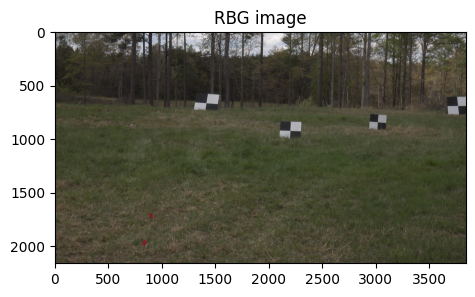

In [9]:
fig, axes = plt.subplots(1, 1, figsize=(20, 3))

try:
  im = axes.imshow(img_bbvisright[:, :, [0,1,2]])
  axes.set_title('RBG image')

  axes.label_outer()
  plt.show()

except Exception as e:
  print(e)

Plotting the LWHSI cube

/tmp/ipykernel_2495/3020541738.py:6: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  return np.clip((image - lo) / (hi - lo + 1e-12), 0, 1)


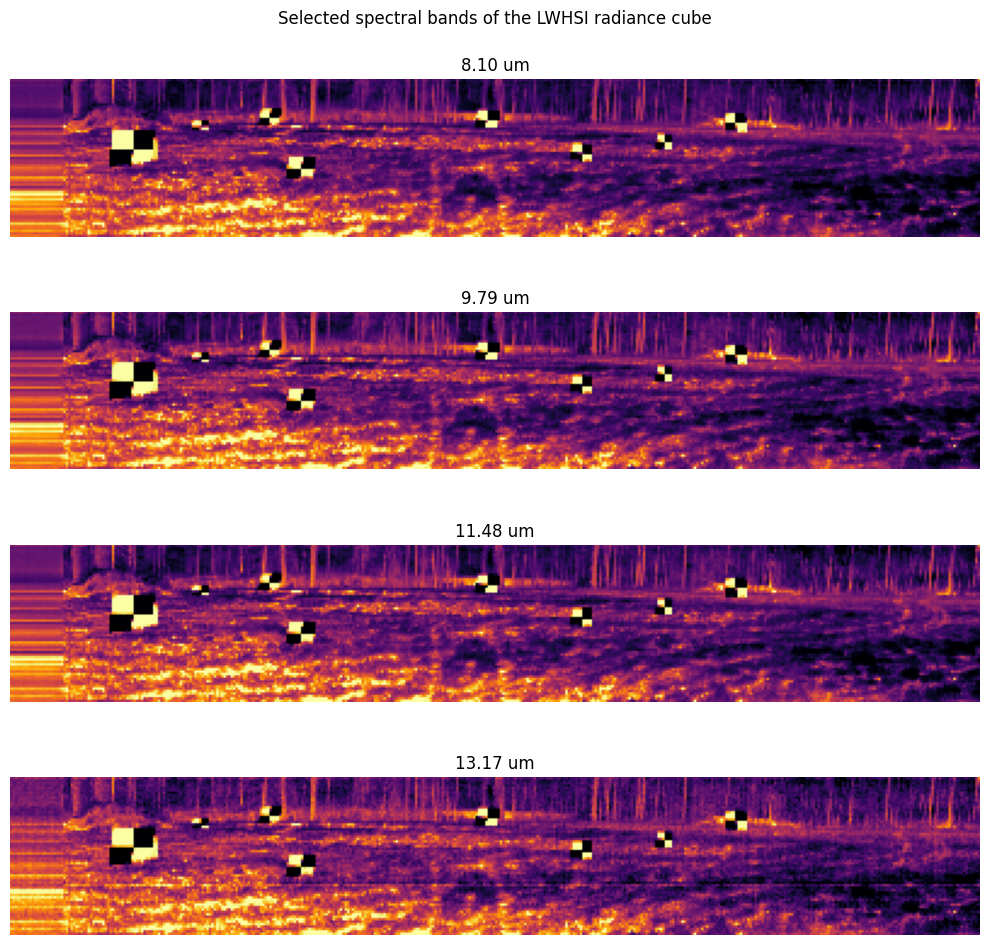

In [10]:
try:
  if hasattr(img, 'bands') and 'wavelength' in img.metadata:
        wavelengths_um = [float(w) for w in img.metadata['wavelength']]
  else:
      num_bandas = radiance_hsi.shape[2]
      wavelengths_um = np.linspace(8.0, 12.0, num_bandas)

  band_indices = np.linspace(0, len(wavelengths_um) - 1, 4, dtype=int)
  plot_stride = 4

  fig, axes = plt.subplots(len(band_indices), 1, figsize=(10, 10))
  axes = axes.ravel()

  for ax, band_index in zip(axes, band_indices):
      band_image = radiance_hsi[::plot_stride, ::plot_stride, band_index]
      im = ax.imshow(robust_image(band_image), cmap='inferno')
      ax.set_title(f'{wavelengths_um[band_index]:.2f} um')
      ax.axis('off')

  fig.suptitle('Selected spectral bands of the LWHSI radiance cube')
  plt.tight_layout()
  plt.show()
except Exception as e:
    print(f'Error: {e}')

You can select whatever band you want (the images have a total of 256 bands)

/tmp/ipykernel_2495/3020541738.py:6: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  return np.clip((image - lo) / (hi - lo + 1e-12), 0, 1)


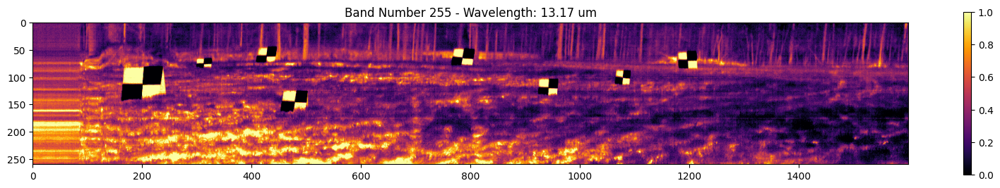

In [11]:
fig, axes = plt.subplots(1, 1, figsize=(20, 3))

# Change the current band with this variable
selected_band = 255

try:

  im = axes.imshow(robust_image(radiance_hsi[:, :, selected_band]), cmap='inferno')
  axes.set_title(f'Band Number {selected_band} - Wavelength: {wavelengths_um[selected_band]:.2f} um')

  axes.label_outer()
  plt.colorbar(im, ax=axes)
  plt.show()

except Exception as e:
  print(e)


Select the pixels you want to plot (image shape is (260,1600,256)) on the image

In [12]:
# Format is (x,y, # pixel, "Pixel #")

selected_pixels = [
    (180, 1050, 1, "Pixel 1"),
    (40, 250, 2, "Pixel 2"),
    (250, 370, 3, "Pixel 3"),
    (252, 273, 4, "Pixel 4")
]

selected_pixels

[(180, 1050, 1, 'Pixel 1'),
 (40, 250, 2, 'Pixel 2'),
 (250, 370, 3, 'Pixel 3'),
 (252, 273, 4, 'Pixel 4')]

Select the temperature in Kelvin

In [13]:
# Modify the temperature value with this variable
temperature_k = 300

/tmp/ipykernel_2495/3020541738.py:6: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  return np.clip((image - lo) / (hi - lo + 1e-12), 0, 1)


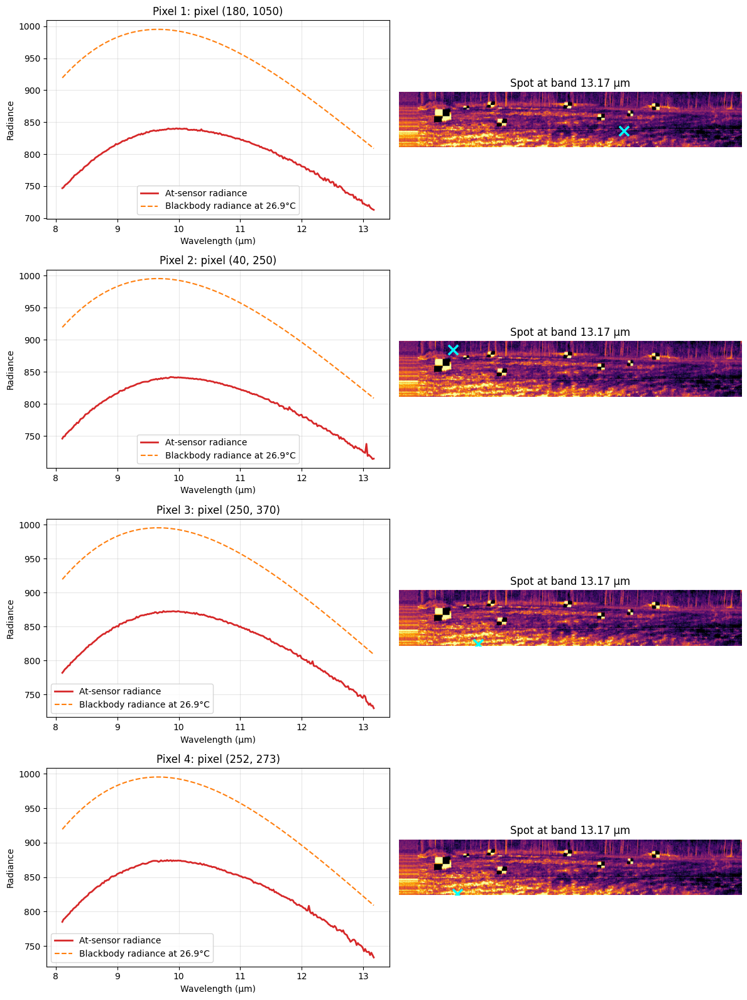

In [14]:
wavelengths_um = np.array(wavelengths_um)
blackbody_curve=blackbody_radiance(wavelengths_um, temperature_k)

context_band = int(np.argmin(np.abs(wavelengths_um - 10.0)))
context_image = robust_image(radiance_hsi[::plot_stride, ::plot_stride, selected_band])

fig, axes = plt.subplots(len(selected_pixels), 2, figsize=(12, 4 * len(selected_pixels)))
if len(selected_pixels) == 1:
    axes = axes[None, :]

for row_axes, (row, col, material_id, material_name) in zip(axes, selected_pixels):
    ax_spec, ax_img = row_axes
    ax_spec.plot(wavelengths_um, radiance_hsi[row, col, :].flatten(), color='tab:red', linewidth=2, label='At-sensor radiance')
    ax_spec.plot(wavelengths_um, blackbody_curve, color='tab:orange', linestyle='--', linewidth=1.5,
                 label=f'Blackbody radiance at {temperature_k-273.15:.1f}°C')
    ax_spec.set_title(f'{material_name}: pixel ({row}, {col})')
    ax_spec.set_xlabel('Wavelength (µm)')
    ax_spec.set_ylabel('Radiance')
    ax_spec.grid(True, alpha=0.3)
    ax_spec.legend()
    ax_img.imshow(context_image, cmap='inferno', aspect='equal')
    ax_img.scatter(col / plot_stride, row / plot_stride, s=120, marker='x', color='cyan', linewidths=2.5)
    ax_img.set_title(f'Spot at band {wavelengths_um[selected_band]:.2f} µm')
    ax_img.axis('off')

plt.tight_layout()
plt.show()

# LIDAR (DEPTH TRUTH)

In [15]:
for lidar_file in lidar_files:
  las = laspy.read(lidar_file)
  x = np.array(las.x)
  y = np.array(las.y)
  z = np.array(las.z)

  points_3dmap = np.vstack((x, y, z)).T

  plot_point_cloud(
      points_3dmap,
      color_by="range",
      max_points=100000,
      title=f"LiDAR points, file: {lidar_file}"
  )

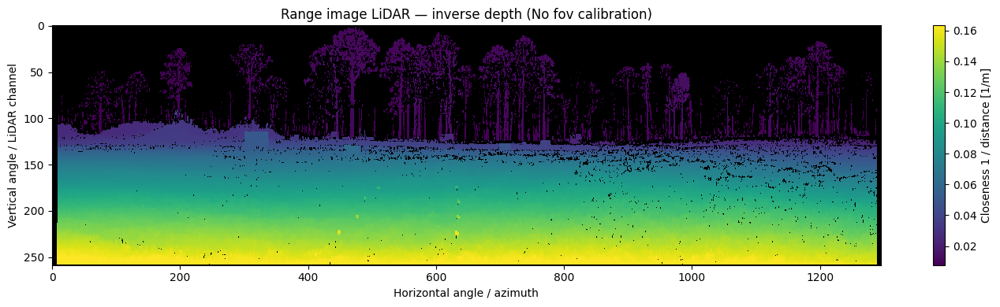

In [17]:
for lidar_file in lidar_files:
  las = laspy.read(lidar_file)
  x = np.array(las.x)
  y = np.array(las.y)
  z = np.array(las.z)

  points_2dmap = np.vstack((-x, y, z)).T

  xyz = points_2dmap[:, :3]
  ranges = np.linalg.norm(xyz, axis=1)

  max_range = 500
  mask_close = ranges < max_range
  points_close = points_2dmap[mask_close]

  range_img = compute_range_image(
      points_close,
      H=260,
      W=1600,
      v_fov=(-20, 15),
      h_fov=(-75, 75),
      min_range=0.5,
      max_range=500.0
  )

  plot_range_image(
      range_img,
      title="Range image LiDAR — inverse depth (No fov calibration)",
      crop=True,
      inverse_depth=True
  )

# EMISSIVITY

Loading reflectance obtained in the Ecostress Spectral Library

In [18]:
vegetation = list(Path("/content").glob("**/vegetation/*.txt"))
soil = list(Path("/content").glob("**/soil/*.txt"))
manmade = list(Path("/content").glob("**/manmade/*.txt"))

soil_wavelength, soil_emissivity = emissivity_and_wavelength(soil[47])
grass_wavelength, grass_emissivity = emissivity_and_wavelength(vegetation[8])
tree_wavelength, tree_emissivity = emissivity_and_wavelength(manmade[70])
calibrationpoints_wavelength, calibrationpoints_emissivity = emissivity_and_wavelength(manmade[53])
leaves_wavelength, leaves_emissivity = emissivity_and_wavelength(vegetation[1768])

Using K-Means to segment both the RGB and LWHSI images and get the emissivity truth map

In [19]:
h, w, h2, w2, rgb_centers, labels_rgb, kmeans_lwhsi, labels_lwhsi_2d = segmentation_maps(5, img_bbvisright, radiance_hsi)

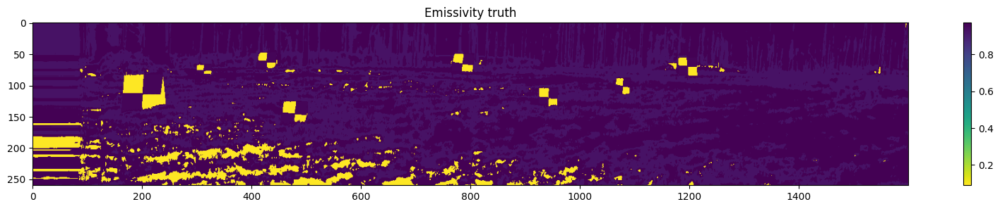

In [20]:
emissivity_map = emissivity_truth_map(h,
                     w,
                     h2,
                     w2,
                     rgb_centers,
                     labels_rgb,
                     kmeans_lwhsi,
                     labels_lwhsi_2d,
                     calibrationpoints_emissivity,
                     soil_emissivity,
                     leaves_emissivity,
                     tree_emissivity,
                     grass_emissivity,
                     wavelengths_um,
                     calibrationpoints_wavelength,
                     soil_wavelength,
                     leaves_wavelength,
                     tree_wavelength,
                     grass_wavelength)

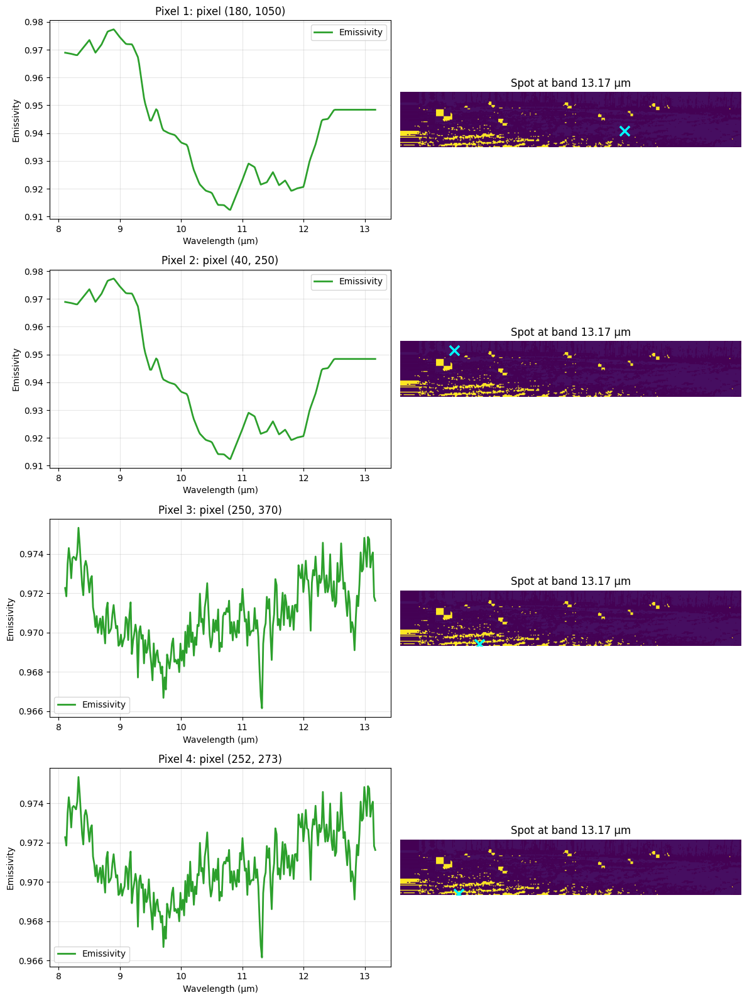

In [21]:
wavelengths_um = np.array(wavelengths_um)

context_band = int(np.argmin(np.abs(wavelengths_um - 10.0)))
context_image = robust_image(emissivity_map[::plot_stride, ::plot_stride, selected_band])

fig, axes = plt.subplots(len(selected_pixels), 2, figsize=(12, 4 * len(selected_pixels)))
if len(selected_pixels) == 1:
    axes = axes[None, :]

for row_axes, (row, col, material_id, material_name) in zip(axes, selected_pixels):
    ax_spec, ax_img = row_axes
    ax_spec.plot(wavelengths_um, emissivity_map[row, col, :].flatten(), color='tab:green', linewidth=2, label='Emissivity')
    ax_spec.set_title(f'{material_name}: pixel ({row}, {col})')
    ax_spec.set_xlabel('Wavelength (µm)')
    ax_spec.set_ylabel('Emissivity')
    ax_spec.grid(True, alpha=0.3)
    ax_spec.legend()
    ax_img.imshow(context_image, cmap='viridis_r', aspect='equal')
    ax_img.scatter(col / plot_stride, row / plot_stride, s=120, marker='x', color='cyan', linewidths=2.5)
    ax_img.set_title(f'Spot at band {wavelengths_um[selected_band]:.2f} µm')
    ax_img.axis('off')

plt.tight_layout()
plt.show()

---

# Temprature

# Basic Gradiant Descent

In [ ]:
# Assuming dimensions based on radiance_hsi.shape (260, 1600, 256)
h, w, bands = radiance_hsi.shape


depth = range_img

temperature_c = np.full((h, w), 20.0, dtype=np.float32)


emissivity = np.full((h, w, bands), 0.9, dtype=np.float32)

# Placeholder for air_temperature_c (scalar). Replace with actual data if available.
air_temperature_c = 25.0


downwelling_radiance = np.full(bands, 100.0, dtype=np.float32) #***


attenuation_db_per_m = np.full(bands, 0.1, dtype=np.float32)

In [22]:
def transmittance(depth_map):
    """Atmospheric transmittance for every wavelength using attenuation in dB/m."""
    optical_loss_db = attenuation_db_per_m[None, None, :] * depth_map[:, :, None]
    return (10 ** (-optical_loss_db / 10.0)).astype(np.float32)


def d_blackbody_radiance_d_temperature(wavelengths_um,temperature_k_map):
    """Derivative of blackbody radiance with respect to temperature in Kelvin."""
    h = 6.62607015e-34
    c = 299792458.0
    k = 1.380649e-23

    wavelength_m = wavelengths_um[None, None, :] * 1e-6
    temperature_k_map = temperature_k_map[:, :, None]

    x = (h * c) / (wavelength_m * k * temperature_k_map)
    exp_x = np.exp(x)
    scale = (2.0 * h * c**2) / wavelength_m**5 * 1e-6 * MICROFLICK_PER_W_M2
    derivative = scale * exp_x * x / (temperature_k_map * (exp_x - 1.0) ** 2)
    return derivative.astype(np.float32)

## Manual Basic Gradient Descent

In [25]:
def manual_gradient_descent(
    observed_radiance,
    air_temperature_c,
    downwelling_radiance,
    iterations=800,
    record_every=50,
    initial_emissivity=0.9,
    initial_depth=20.0,
    initial_temperature_c=20.0,
    learning_rate_emissivity=1e-2,
    learning_rate_depth=1e2,
    learning_rate_temperature=20.0,
    depth_truth=None,
    temperature_truth_c=None,
    emissivity_truth=None,
):
    """Estimate emissivity, depth, and object temperature.

    T_air and the incident downwelling radiance are fixed inputs.
    They are used by the RTE but are not estimated here.
    """
    observed_radiance = np.asarray(
        observed_radiance,
        dtype=np.float32,
    )
    n_bands = observed_radiance.shape[2]
    radiance_scale = np.maximum(
        np.mean(
            observed_radiance,
            axis=2,
            keepdims=True,
        ),
        1.0,
    )

    #Initial Values
    predicted_emissivity = np.full_like(
        observed_radiance,
        initial_emissivity,
        dtype=np.float32,
    )
    predicted_depth = np.full(
        observed_radiance.shape[:2],
        initial_depth,
        dtype=np.float32,
    )
    predicted_temperature_k = np.full(
        observed_radiance.shape[:2],
        initial_temperature_c + 273.15,
        dtype=np.float32,
    )

    # Constant Values
    air_temperature_k = np.array(
        [[air_temperature_c + 273.15]],
        dtype=np.float32,
    )
    air_blackbody = blackbody_radiance(
        wavelengths_um, air_temperature_k
    )

    fixed_downwelling = np.asarray(
        downwelling_radiance,
        dtype=np.float32,
    )
    if fixed_downwelling.ndim == 1:
        fixed_downwelling = (
            fixed_downwelling[None, None, :]
        )
    if fixed_downwelling.shape[-1] != n_bands:
        raise ValueError(
            'downwelling_radiance must have one value per band.'
        )
    try:
        fixed_downwelling = np.broadcast_to(
            fixed_downwelling,
            observed_radiance.shape,
        )
    except ValueError as exc:
        raise ValueError(
            'downwelling_radiance must broadcast to '
            'observed_radiance.'
        ) from exc

    attenuation_factor = (
        -(np.log(10.0) / 10.0)
        * attenuation_db_per_m[None, None, :]
    )
    history = []

    for iteration in range(iterations + 1):
        blackbody = blackbody_radiance(
            wavelengths_um, predicted_temperature_k
        )
        transmittance_term = transmittance(
            predicted_depth
        )

        # Forward
        surface_leaving = (
            predicted_emissivity * blackbody
            + (1.0 - predicted_emissivity)
            * fixed_downwelling
        )
        prediction = (
            transmittance_term * surface_leaving
            + (1.0 - transmittance_term)
            * air_blackbody
        )


        normalized_error = (
            prediction - observed_radiance
        ) / radiance_scale
        loss = np.mean(normalized_error**2)

        if (
            iteration % record_every == 0
            or iteration == iterations
        ):
            row = {
                'iteration': iteration,
                'normalized_radiance_rmse': float(
                    np.sqrt(loss)
                ),
            }
            if depth_truth is not None:
                row['depth_rmse'] = float(
                    np.sqrt(
                        np.mean(
                            (
                                predicted_depth
                                - depth_truth
                            ) ** 2
                        )
                    )
                )
            if temperature_truth_c is not None:
                predicted_temperature_c = (
                    predicted_temperature_k - 273.15
                )
                row['temperature_rmse'] = float(
                    np.sqrt(
                        np.mean(
                            (
                                predicted_temperature_c
                                - temperature_truth_c
                            ) ** 2
                        )
                    )
                )
            if emissivity_truth is not None:
                row['emissivity_rmse'] = float(
                    np.sqrt(
                        np.mean(
                            (
                                predicted_emissivity
                                - emissivity_truth
                            ) ** 2
                        )
                    )
                )
            history.append(row)

        if iteration == iterations:
            break

        residual_factor = (
            (2.0 / n_bands)
            * (prediction - observed_radiance)
            / (radiance_scale**2)
        )

        # Gradients
        grad_emissivity = (
            residual_factor
            * transmittance_term
            * (blackbody - fixed_downwelling)
        )

        grad_depth = np.sum(
            residual_factor
            * (surface_leaving - air_blackbody)
            * attenuation_factor
            * transmittance_term,
            axis=2,
        )

        grad_temperature = np.sum(
            residual_factor
            * predicted_emissivity
            * transmittance_term
            * d_blackbody_radiance_d_temperature(
                wavelengths_um, predicted_temperature_k
            ),
            axis=2,
        )

        # New Values
        predicted_emissivity = np.clip(
            predicted_emissivity
            - learning_rate_emissivity
            * grad_emissivity,
            0.6,
            1.0,
        )
        predicted_depth = np.clip(
            predicted_depth
            - learning_rate_depth * grad_depth,
            0.0,
            120.0,
        )
        predicted_temperature_k = np.clip(
            predicted_temperature_k
            - learning_rate_temperature
            * grad_temperature,
            273.15,
            313.15,
        )

    return {
        'emissivity': predicted_emissivity,
        'depth': predicted_depth,
        'temperature_c': (
            predicted_temperature_k - 273.15
        ),
        'history': history,
    }


## Basic Visualization

In [ ]:
backward_stride = 16

observed_small = radiance_hsi[::backward_stride, ::backward_stride, :]
depth_truth_small = depth[::backward_stride, ::backward_stride]
temperature_truth_small = temperature_c[::backward_stride, ::backward_stride]
emissivity_truth_small = emissivity[::backward_stride, ::backward_stride, :]

inverse_result = manual_gradient_descent(
    observed_small,
    air_temperature_c=air_temperature_c,
    downwelling_radiance=downwelling_radiance,
    iterations=3000,
    record_every=50,
    depth_truth=depth_truth_small,
    temperature_truth_c=temperature_truth_small,
    emissivity_truth=emissivity_truth_small,
)

print('Estimated emissivity:', inverse_result['emissivity'].shape)
print('Estimated depth:', inverse_result['depth'].shape)
print('Estimated temperature:', inverse_result['temperature_c'].shape)
print('Final metrics:', inverse_result['history'][-1])


Estimated emissivity: (17, 100, 256)
Estimated depth: (17, 100)
Estimated temperature: (17, 100)
Final metrics: {'iteration': 3000, 'normalized_radiance_rmse': 0.011518306098878384, 'depth_rmse': 14.110839063527614, 'temperature_rmse': 8.031123161315918, 'emissivity_rmse': 0.002442495431751013}


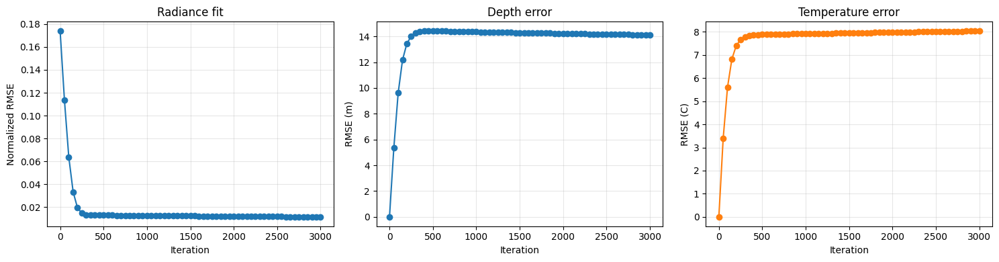

In [ ]:
history = inverse_result['history']
iterations = [row['iteration'] for row in history]

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
axes[0].plot(iterations, [row['normalized_radiance_rmse'] for row in history], marker='o')
axes[0].set_title('Radiance fit')
axes[0].set_xlabel('Iteration')
axes[0].set_ylabel('Normalized RMSE')
axes[0].grid(True, alpha=0.3)

axes[1].plot(iterations, [row['depth_rmse'] for row in history], marker='o', color='tab:blue')
axes[1].set_title('Depth error')
axes[1].set_xlabel('Iteration')
axes[1].set_ylabel('RMSE (m)')
axes[1].grid(True, alpha=0.3)

axes[2].plot(iterations, [row['temperature_rmse'] for row in history], marker='o', color='tab:orange')
axes[2].set_title('Temperature error')
axes[2].set_xlabel('Iteration')
axes[2].set_ylabel('RMSE (C)')
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


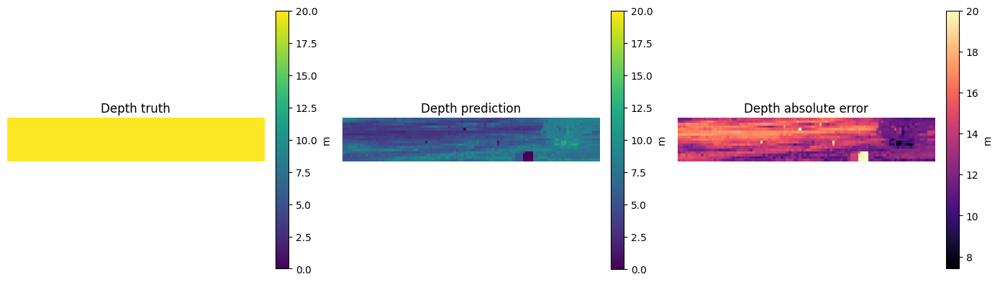

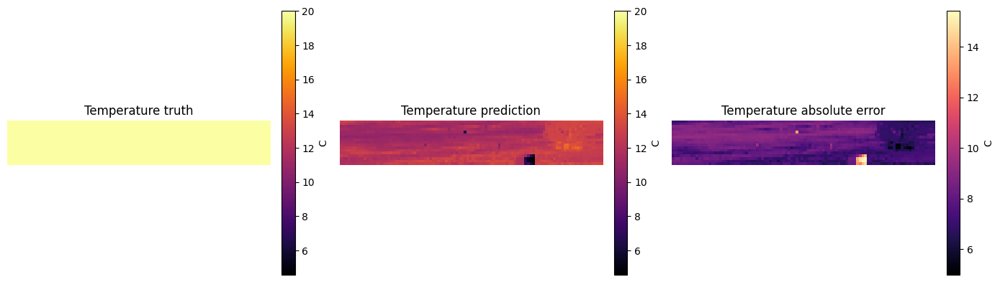

In [ ]:
def plot_truth_prediction_error(truth, prediction, title, unit, cmap='viridis'):
    error = np.abs(prediction - truth)
    vmin = min(float(np.min(truth)), float(np.min(prediction)))
    vmax = max(float(np.max(truth)), float(np.max(prediction)))

    fig, axes = plt.subplots(1, 3, figsize=(14, 4))
    im0 = axes[0].imshow(truth, cmap=cmap, vmin=vmin, vmax=vmax)
    axes[0].set_title(f'{title} truth')
    axes[0].axis('off')
    plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04, label=unit)

    im1 = axes[1].imshow(prediction, cmap=cmap, vmin=vmin, vmax=vmax)
    axes[1].set_title(f'{title} prediction')
    axes[1].axis('off')
    plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04, label=unit)

    im2 = axes[2].imshow(error, cmap='magma')
    axes[2].set_title(f'{title} absolute error')
    axes[2].axis('off')
    plt.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04, label=unit)

    plt.tight_layout()
    plt.show()

plot_truth_prediction_error(depth_truth_small, inverse_result['depth'], 'Depth', 'm')
plot_truth_prediction_error(
    temperature_truth_small, inverse_result['temperature_c'], 'Temperature', 'C', cmap='inferno'
)


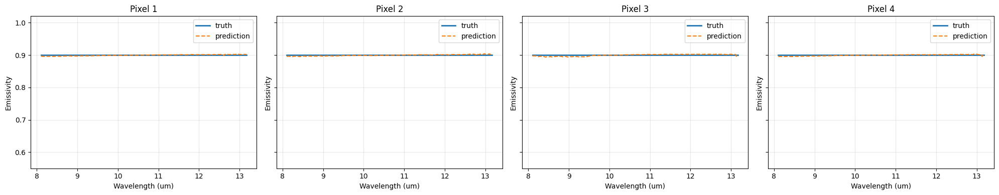

Selected-pixel emissivity RMSE: 0.0023674408439546824


In [ ]:
selected_rows = np.array([pixel[0] for pixel in selected_pixels])
selected_cols = np.array([pixel[1] for pixel in selected_pixels])
selected_names = [pixel[3] for pixel in selected_pixels]

selected_small_rows = selected_rows // backward_stride
selected_small_cols = selected_cols // backward_stride
emissivity_truth_pixels = emissivity[selected_rows, selected_cols, :]
emissivity_prediction_pixels = inverse_result['emissivity'][selected_small_rows, selected_small_cols, :]

fig, axes = plt.subplots(1, len(selected_names), figsize=(5 * len(selected_names), 4), sharey=True)
if len(selected_names) == 1:
    axes = [axes]

for i, (ax, material_name) in enumerate(zip(axes, selected_names)):
    ax.plot(wavelengths_um, emissivity_truth_pixels[i, :], label='truth', linewidth=2)
    ax.plot(wavelengths_um, emissivity_prediction_pixels[i, :], label='prediction', linestyle='--')
    ax.set_title(material_name)
    ax.set_xlabel('Wavelength (um)')
    ax.set_ylabel('Emissivity')
    ax.set_ylim(0.55, 1.02)
    ax.grid(True, alpha=0.3)
    ax.legend()

plt.tight_layout()
plt.show()

print('Selected-pixel emissivity RMSE:', float(np.sqrt(np.mean((emissivity_prediction_pixels - emissivity_truth_pixels) ** 2))))


In [ ]:
def invert_blackbody_temperature(wavelength_um, radiance_microflicks, emissivity=1.0):
    """Invierte la ley de Planck: dada una radiancia observada a una longitud
    de onda, resuelve la temperatura de cuerpo negro que la produciría."""
    h = 6.62607015e-34
    c = 299792458.0
    k = 1.380649e-23

    wavelength_m = wavelength_um * 1e-6
    L_w_m2_sr_um = np.asarray(radiance_microflicks, dtype=np.float64) / (MICROFLICK_PER_W_M2 * emissivity)
    L_w_m2_sr_m = np.maximum(L_w_m2_sr_um, 1e-12) * 1e6

    ratio = (2.0 * h * c**2) / (wavelength_m**5 * L_w_m2_sr_m)
    temperature_k = (h * c) / (wavelength_m * k * np.log1p(ratio))
    return temperature_k.astype(np.float32)

Usando banda a 10.01 um


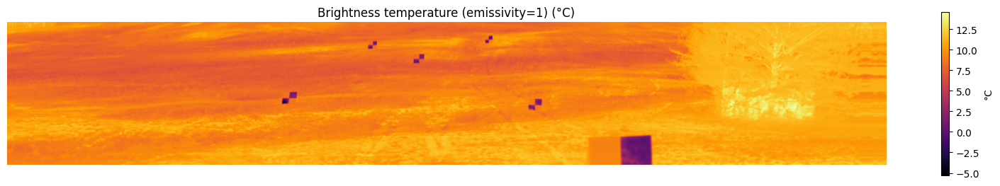

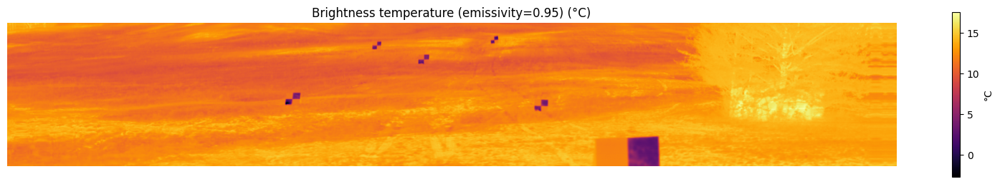

In [ ]:
def compute_temperature_image(radiance_hsi, wavelengths_um, band_wavelength=10.0, emissivity=1.0):
    """Equivalente al range_img del LiDAR, pero para temperatura.
    Elige UNA banda dentro de una ventana atmosférica limpia (~10-11 um es buena
    para LWIR, evita bandas con fuerte absorción de ozono/vapor de agua ~9.6 y ~6-7 um).
    """
    band_idx = int(np.argmin(np.abs(np.asarray(wavelengths_um) - band_wavelength)))
    wl = wavelengths_um[band_idx]
    radiance_band = radiance_hsi[:, :, band_idx]

    temperature_img = invert_blackbody_temperature(wl, radiance_band, emissivity=emissivity)
    return temperature_img, wl

def plot_temperature_image(temperature_img, title="Brightness temperature", in_celsius=True):
    img = temperature_img - 273.15 if in_celsius else temperature_img
    unit = "°C" if in_celsius else "K"

    fig, ax = plt.subplots(figsize=(20, 3))
    im = ax.imshow(img, cmap='inferno')
    ax.set_title(f"{title} ({unit})")
    ax.axis('off')
    plt.colorbar(im, ax=ax, label=unit)
    plt.show()

def plot_temperature_image(temperature_c, title="Estimated surface temperature"):
    fig, ax = plt.subplots(figsize=(20, 3))
    im = ax.imshow(temperature_c, cmap='inferno')
    ax.set_title(f"{title} (°C)")
    ax.axis('off')
    plt.colorbar(im, ax=ax, label="°C")
    plt.show()


# Uso, calcado del patrón que usó tu compañero para LiDAR:
temperature_img, used_wavelength = compute_temperature_image(
    radiance_hsi, wavelengths_um, band_wavelength=10.0, emissivity=1.0
)
print(f"Usando banda a {used_wavelength:.2f} um")
plot_temperature_image(temperature_img, title="Brightness temperature (emissivity=1)")

# opcional: con una emisividad típica de terreno natural en vez de 1.0
temperature_img_e95, _ = compute_temperature_image(
    radiance_hsi, wavelengths_um, band_wavelength=10.0, emissivity=0.95
)
plot_temperature_image(temperature_img_e95, title="Brightness temperature (emissivity=0.95)")

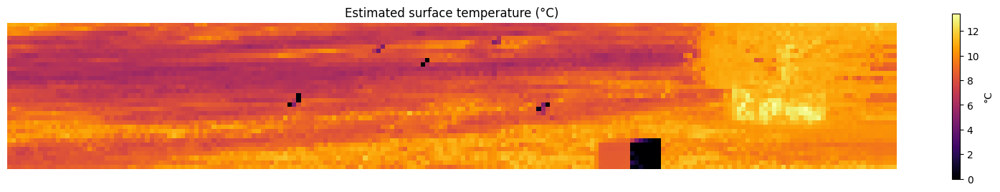

{'iteration': 0, 'normalized_radiance_rmse': 0.110711470246315, 'depth_rmse': 0.0, 'temperature_rmse': 7.887182712554932, 'emissivity_rmse': 0.0}
{'iteration': 100, 'normalized_radiance_rmse': 0.07395327836275101, 'depth_rmse': 9.445013291135696, 'temperature_rmse': 8.935867309570312, 'emissivity_rmse': 2.0362367649795488e-05}
{'iteration': 200, 'normalized_radiance_rmse': 0.042154110968112946, 'depth_rmse': 16.21661516535138, 'temperature_rmse': 9.67872142791748, 'emissivity_rmse': 3.677832864923403e-05}
{'iteration': 300, 'normalized_radiance_rmse': 0.02576916664838791, 'depth_rmse': 18.771082407474577, 'temperature_rmse': 10.134310722351074, 'emissivity_rmse': 4.86194621771574e-05}
{'iteration': 400, 'normalized_radiance_rmse': 0.017848949879407883, 'depth_rmse': 19.674121061925785, 'temperature_rmse': 10.440116882324219, 'emissivity_rmse': 5.8333640481578186e-05}
{'iteration': 500, 'normalized_radiance_rmse': 0.013879080303013325, 'depth_rmse': 19.93137350888322, 'temperature_rmse'

In [ ]:
# ---- 1. wavelengths ya los tienes de la carga ENVI ----
wavelengths_um = np.array(wavelengths_um, dtype=np.float32)
n_bands = radiance_hsi.shape[2]

# ---- 2. parámetros físicos fijos (mientras no tengas calibración real) ----
attenuation_db_per_m = np.full(n_bands, 0.1, dtype=np.float32)   # TODO: reemplazar si encuentras cal real
air_temperature_c = 20.0                                         # TODO: reemplazar si hay log de temp. ambiente
downwelling_radiance = blackbody_radiance(
    wavelengths_um, np.float32(air_temperature_c + 273.15 - 5)   # aprox: cielo unos grados más frío que el aire
)

# ---- 3. downsample, igual que hizo tu compañero con max_points ----
stride = 8
observed_small = radiance_hsi[::stride, ::stride, :]

# Prepare truth values for the current stride
depth_truth_small = depth[::stride, ::stride]
temperature_truth_small = temperature_c[::stride, ::stride]
emissivity_truth_small = emissivity[::stride, ::stride, :]

# ---- 4. warm start: arranca la temperatura desde la brillo-temperatura,
#         en vez de un valor plano — converge más rápido y más estable ----
band_idx = int(np.argmin(np.abs(wavelengths_um - 10.0)))
warm_start_temp_c = np.squeeze(invert_blackbody_temperature(
    wavelengths_um[band_idx], observed_small[:, :, band_idx], emissivity=0.95
)) - 273.15

# ---- 5. correr la inversión (SIN los learning rates originales de 1e6!) ----
result = manual_gradient_descent(
    observed_small,
    air_temperature_c=air_temperature_c,
    downwelling_radiance=downwelling_radiance,
    iterations=1500,
    record_every=100,
    initial_temperature_c=warm_start_temp_c,   # mapa, no escalar
    initial_depth=20.0,
    initial_emissivity=0.9,
    learning_rate_emissivity=5e-3,
    learning_rate_depth=2e2,
    learning_rate_temperature=5.0,
    depth_truth=depth_truth_small, # Pass depth truth
    temperature_truth_c=temperature_truth_small, # Pass temperature truth
    emissivity_truth=emissivity_truth_small, # Pass emissivity truth
)

# ---- 6. graficar, igual que plot_range_image ----
def plot_temperature_image(temperature_c, title="Estimated surface temperature"):
    fig, ax = plt.subplots(figsize=(20, 3))
    im = ax.imshow(temperature_c, cmap='inferno')
    ax.set_title(f"{title} (°C)")
    ax.axis('off')
    plt.colorbar(im, ax=ax, label="°C")
    plt.show()

plot_temperature_image(result['temperature_c'])

for row in result['history']:
    print(row)

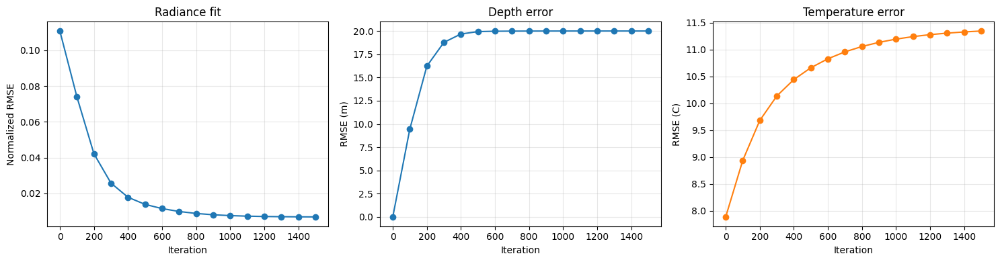

In [ ]:
history = result['history']
iterations = [row['iteration'] for row in history]

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
axes[0].plot(iterations, [row['normalized_radiance_rmse'] for row in history], marker='o')
axes[0].set_title('Radiance fit')
axes[0].set_xlabel('Iteration')
axes[0].set_ylabel('Normalized RMSE')
axes[0].grid(True, alpha=0.3)

axes[1].plot(iterations, [row['depth_rmse'] for row in history], marker='o', color='tab:blue')
axes[1].set_title('Depth error')
axes[1].set_xlabel('Iteration')
axes[1].set_ylabel('RMSE (m)')
axes[1].grid(True, alpha=0.3)

axes[2].plot(iterations, [row['temperature_rmse'] for row in history], marker='o', color='tab:orange')
axes[2].set_title('Temperature error')
axes[2].set_xlabel('Iteration')
axes[2].set_ylabel('RMSE (C)')
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


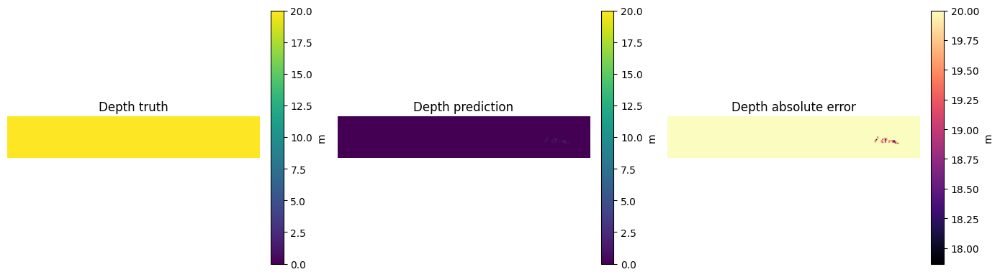

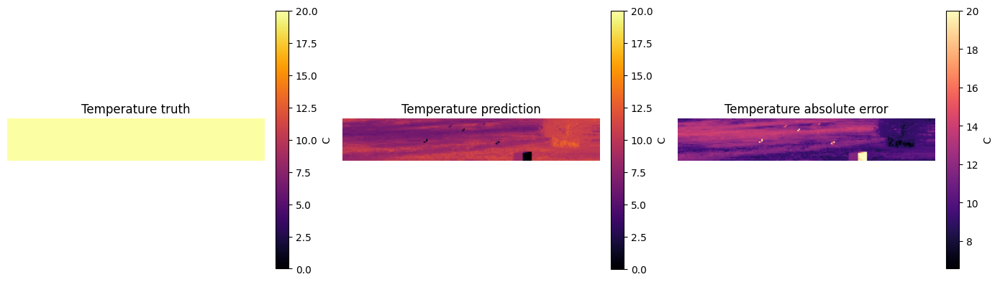

In [ ]:
def plot_truth_prediction_error(truth, prediction, title, unit, cmap='viridis'):
    error = np.abs(prediction - truth)
    vmin = min(float(np.min(truth)), float(np.min(prediction)))
    vmax = max(float(np.max(truth)), float(np.max(prediction)))

    fig, axes = plt.subplots(1, 3, figsize=(14, 4))
    im0 = axes[0].imshow(truth, cmap=cmap, vmin=vmin, vmax=vmax)
    axes[0].set_title(f'{title} truth')
    axes[0].axis('off')
    plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04, label=unit)

    im1 = axes[1].imshow(prediction, cmap=cmap, vmin=vmin, vmax=vmax)
    axes[1].set_title(f'{title} prediction')
    axes[1].axis('off')
    plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04, label=unit)

    im2 = axes[2].imshow(error, cmap='magma')
    axes[2].set_title(f'{title} absolute error')
    axes[2].axis('off')
    plt.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04, label=unit)

    plt.tight_layout()
    plt.show()

plot_truth_prediction_error(depth_truth_small, result['depth'], 'Depth', 'm')
plot_truth_prediction_error(
    temperature_truth_small, result['temperature_c'], 'Temperature', 'C', cmap='inferno'
)


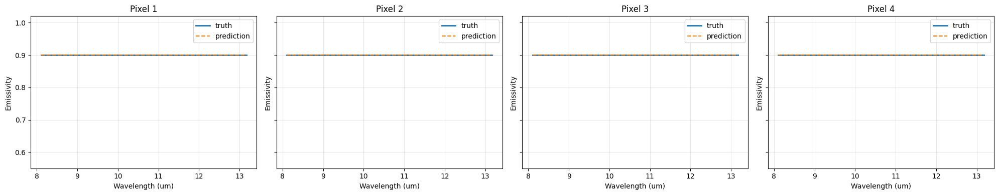

Selected-pixel emissivity RMSE: 0.00011150576756335795


In [ ]:
selected_rows = np.array([pixel[0] for pixel in selected_pixels])
selected_cols = np.array([pixel[1] for pixel in selected_pixels])
selected_names = [pixel[3] for pixel in selected_pixels]

selected_small_rows = selected_rows // backward_stride
selected_small_cols = selected_cols // backward_stride
emissivity_truth_pixels = emissivity[selected_rows, selected_cols, :]
emissivity_prediction_pixels = result['emissivity'][selected_small_rows, selected_small_cols, :]

fig, axes = plt.subplots(1, len(selected_names), figsize=(5 * len(selected_names), 4), sharey=True)
if len(selected_names) == 1:
    axes = [axes]

for i, (ax, material_name) in enumerate(zip(axes, selected_names)):
    ax.plot(wavelengths_um, emissivity_truth_pixels[i, :], label='truth', linewidth=2)
    ax.plot(wavelengths_um, emissivity_prediction_pixels[i, :], label='prediction', linestyle='--')
    ax.set_title(material_name)
    ax.set_xlabel('Wavelength (um)')
    ax.set_ylabel('Emissivity')
    ax.set_ylim(0.55, 1.02)
    ax.grid(True, alpha=0.3)
    ax.legend()

plt.tight_layout()
plt.show()

print('Selected-pixel emissivity RMSE:', float(np.sqrt(np.mean((emissivity_prediction_pixels - emissivity_truth_pixels) ** 2))))
